# IDB_drilling_signal

## Import packages

In [1]:
!nvidia-smi

import IPython
import librosa
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import random
import scipy.io as scio
import time

from keras.models import load_model
from keras.utils.np_utils import to_categorical
from pyts.image import RecurrencePlot, MarkovTransitionField, GramianAngularField
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tqdm import tqdm

HOST_path = "/hpctmp/e1097232"

random.seed(42)

def nameof(var):
    for name, value in globals().items():
        if value is var:
            return name

Wed Jun 21 15:51:06 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.60.13    Driver Version: 525.60.13    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:1A:00.0 Off |                    0 |
| N/A   37C    P0    45W / 300W |      0MiB / 32768MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Load signal data

In [2]:
RATE = 8192

def read_matFile(signal_path):
    signal_file = scio.loadmat(signal_path)
    signal_value = signal_file['samples']
    signal_value = np.squeeze(signal_value)
    print("signal_shape:", signal_value.shape, "sampling_rate:", RATE, "time:", len(signal_value)/RATE, "s")
    max_value = np.max(np.abs(signal_value))
    signal_value_normalized = signal_value / max_value
    return signal_value_normalized

def read_allFile(signal_path):
    signal_value, signal_rate = librosa.load(signal_path, sr=None, mono=True, offset=0.0, duration=None)
    print("signal_shape:", signal_value.shape, "sampling_rate:", signal_rate, "time:", len(signal_value)/signal_rate, "s")
    if signal_rate != RATE:
        signal_value = librosa.resample(signal_value, orig_sr=signal_rate, target_sr=RATE)
    max_value = np.max(np.abs(signal_value))
    signal_value_normalized = signal_value / max_value
    return signal_value_normalized

# granite
G32h = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment1/matFile/3-2h.mat"))
G41h = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment1/matFile/4-1h.mat"))
G42h = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment1/matFile/4-2h.mat"))
G43b = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment1/matFile/4-3b.mat"))
# sandstone
S11 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/1-1.mat"))
S12 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/1-2.mat"))
S13 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/1-3.mat"))
S14 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/1-4.mat"))
S21 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/2-1.mat"))
S22 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/2-2.mat"))
S23 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/2-3.mat"))
S31 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/3-1.mat"))
S32 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/3-2.mat"))
S33 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/3-3.mat"))
S41 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/4-1.mat"))
S42 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/4-2.mat"))
S43 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/4-3.mat"))
S51 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/5-1.mat"))
S52 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/5-2.mat"))
S53 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/5-3.mat"))
S54 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/5-4.mat"))
S61 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/6-1.mat"))
S62 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/6-2.mat"))
S63 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/6-3.mat"))
S71 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/7-1.mat"))
S72 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/7-2.mat"))
S73 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/7-3.mat"))
S74 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/7-4.mat"))
S81 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/8-1.mat"))
S82 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/8-2.mat"))
S83 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/8-3.mat"))
S91 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/9-1.mat"))
S92 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/9-2.mat"))
S93 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/9-3.mat"))
S94 = read_matFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment2/matFile/9-4.mat"))
# basalt
B11 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/1-1.wav"))
B12 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/1-2.wav"))
B13 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/1-3.wav"))
B21 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/2-1.wav"))
B22 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/2-2.wav"))
B23 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/2-3.wav"))
B31 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/3-1.wav"))
B32 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/3-2.wav"))
B33 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/3-3.wav"))
B41 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/4-1.wav"))
B42 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/4-2.wav"))
B43 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/4-3.wav"))
B51 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/5-1.wav"))
B52 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/5-2.wav"))
B53 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/5-3.wav"))
B54 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/5-4.wav"))
B61 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/6-1.wav"))
B62 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/6-2.wav"))
B63 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/6-3.wav"))
B71 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/7-1.wav"))
B72 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/7-2.wav"))
B73 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/7-3.wav"))
B81 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/8-1.wav"))
B82 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/8-2.wav"))
B83 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/8-3.wav"))
B91 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/9-1.wav"))
B92 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/9-2.wav"))
B93 = read_allFile(os.path.join(HOST_path, "IDB_drilling_signal/Rock_drilling_signal/experiment3/waveFile/9-3.wav"))
print("------------------------------------")
print("All signal normalized with sr = 8192")

signal_shape: (8880128,) sampling_rate: 8192 time: 1084.0 s
signal_shape: (7216896,) sampling_rate: 8192 time: 880.96875 s
signal_shape: (11019776,) sampling_rate: 8192 time: 1345.1875 s
signal_shape: (22244352,) sampling_rate: 8192 time: 2715.375 s
signal_shape: (1248512,) sampling_rate: 8192 time: 152.40625 s
signal_shape: (3898112,) sampling_rate: 8192 time: 475.84375 s
signal_shape: (3248384,) sampling_rate: 8192 time: 396.53125 s
signal_shape: (1114368,) sampling_rate: 8192 time: 136.03125 s
signal_shape: (846336,) sampling_rate: 8192 time: 103.3125 s
signal_shape: (1461248,) sampling_rate: 8192 time: 178.375 s
signal_shape: (1584384,) sampling_rate: 8192 time: 193.40625 s
signal_shape: (727296,) sampling_rate: 8192 time: 88.78125 s
signal_shape: (1953536,) sampling_rate: 8192 time: 238.46875 s
signal_shape: (1200384,) sampling_rate: 8192 time: 146.53125 s
signal_shape: (354560,) sampling_rate: 8192 time: 43.28125 s
signal_shape: (1647872,) sampling_rate: 8192 time: 201.15625 s
si

## Plot signal data

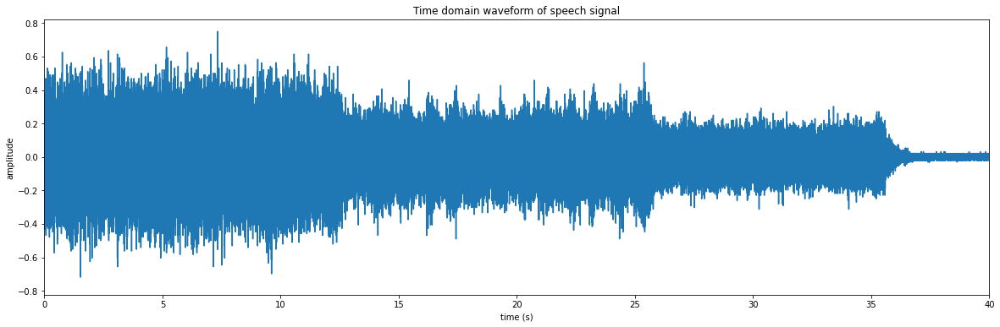

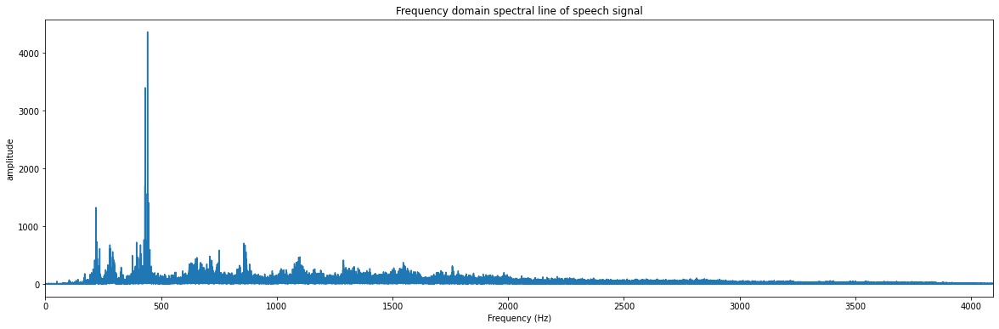

In [3]:
def displayWaveform(signal, rate):
  plt.figure(figsize=(20,6))
  max = np.max(np.absolute(signal))*1.2
  time = np.arange(0, len(SIGNAL)) / RATE
  plt.plot(time, signal)
  plt.title("Time domain waveform of speech signal")
  plt.xlabel("time (s)")
  plt.ylabel("amplitude")
  plt.xlim(0,len(SIGNAL)/RATE)
  ymin, ymax = plt.ylim()
  ylim = np.maximum(np.abs(ymin), np.abs(ymax))
  plt.ylim(-ylim, ylim)

def displaySpectrum(signal, rate):
  plt.figure(figsize=(20,6)) 
  s = np.fft.fft(signal)
  m = np.abs(s)
  n = len(signal)
  f = np.fft.fftfreq(n, 1/rate)
  plt.plot(f[:n//2],m[:n//2])
  plt.title("Frequency domain spectral line of speech signal")
  plt.xlabel("Frequency (Hz)")
  plt.ylabel("amplitude")
  plt.xlim(0, rate//2)

def displaySpectrogram(signal, rate, fftlen):    
  plt.figure(figsize=(8,6))
  plt.specgram(signal, NFFT=fftlen, Fs=rate, noverlap=int(fftlen*0.25), window=np.hanning(fftlen))
  plt.title('Linear-frequency power spectrogram')
  plt.xlabel('time (s)')
  plt.ylabel('Frequency (Hz)')
  plt.colorbar(format="%+2.0f dB")
    
def displayMelspectrogram(signal, rate):
  plt.figure(figsize=(8,6))
  # melspectrogram = librosa.feature.melspectrogram(y=signal, sr=rate)
  D = np.abs(librosa.stft(signal))**2
  S = librosa.feature.melspectrogram(S=D, sr=rate)
  S_dB = librosa.power_to_db(S, ref=np.max)
  img = librosa.display.specshow(S_dB, sr=rate, fmax=rate/2, x_axis='time', y_axis='mel') 
  plt.title('Mel-frequency spectrogram')
  plt.colorbar(format='%+2.0f dB')

def diaplayMFCC(signal, rate):
  plt.figure(figsize=(8,6))
  mfccs = librosa.feature.mfcc(y=signal, sr=rate)
  librosa.display.specshow(mfccs, sr=rate, x_axis='time')

def displayZCR(signal, rate):
  plt.figure(figsize=(8,3))
  zcrs = librosa.feature.zero_crossing_rate(signal)  
  plt.plot(zcrs[0])

def normalize(x, axis=0):
    return preprocessing.minmax_scale(x, axis=axis)

def displayCentroids(signal, rate):
  cent = librosa.feature.spectral_centroid(y=signal, sr=rate) 
  S, phase = librosa.magphase(librosa.stft(y=signal))
  S_db = librosa.amplitude_to_db(S, ref=np.max)
  librosa.feature.spectral_centroid(S=S)
  freqs, times, D = librosa.reassigned_spectrogram(signal, fill_nan=True)
  librosa.feature.spectral_centroid(S=np.abs(D), freq=freqs)
  times = librosa.times_like(cent)
  fig, ax = plt.subplots(nrows=2, sharex=True)
  ax[0].semilogy(times, cent[0], label='Spectral centroid')
  ax[0].set(ylabel='Hz', xticks=[], xlim=[times.min(), times.max()])
  ax[0].legend()
  ax[0].label_outer()
  librosa.display.specshow(S_db, x_axis='time', y_axis='log', ax=ax[1])
  ax[1].plot(times, cent.T, label='Spectral centroid', color='w')
  ax[1].set(title='log Power spectrogram')
  ax[1].legend(loc='lower right')

def displayBandwidth(signal, rate):
  spec_bw = librosa.feature.spectral_bandwidth(y=signal, sr=rate)
  S, phase = librosa.magphase(librosa.stft(y=signal))
  S_db = librosa.amplitude_to_db(S, ref=np.max)
  librosa.feature.spectral_bandwidth(S=S)
  freqs, times, D = librosa.reassigned_spectrogram(signal, fill_nan=True)
  librosa.feature.spectral_bandwidth(S=np.abs(D), freq=freqs)
  times = librosa.times_like(spec_bw)
  centroid = librosa.feature.spectral_centroid(S=S)
  fig, ax = plt.subplots(nrows=2, sharex=True)
  ax[0].semilogy(times, spec_bw[0], label='Spectral bandwidth')
  ax[0].set(ylabel='Hz', xticks=[], xlim=[times.min(), times.max()])
  ax[0].legend()
  ax[0].label_outer()
  librosa.display.specshow(S_db, y_axis='log', x_axis='time', ax=ax[1])
  ax[1].set(title='log Power spectrogram')
  ax[1].fill_between(times, np.maximum(0, centroid[0] - spec_bw[0]), np.minimum(centroid[0] + spec_bw[0], rate/2), alpha=0.5, label='Centroid +- bandwidth')
  ax[1].plot(times, centroid[0], label='Spectral centroid', color='w')
  ax[1].legend(loc='lower right')

def displayRolloff(signal, rate):
  librosa.feature.spectral_rolloff(y=signal, sr=rate)
  rolloff = librosa.feature.spectral_rolloff(y=signal, sr=rate, roll_percent=0.99)
  rolloff_min = librosa.feature.spectral_rolloff(y=signal, sr=rate, roll_percent=0.01)
  S, phase = librosa.magphase(librosa.stft(signal))
  S_db = librosa.amplitude_to_db(S, ref=np.max)
  librosa.feature.spectral_rolloff(S=S, sr=rate)
  librosa.feature.spectral_rolloff(y=signal, sr=rate, roll_percent=0.95)
  fig, ax = plt.subplots()
  librosa.display.specshow(S_db, y_axis='log', x_axis='time', ax=ax)
  ax.plot(librosa.times_like(rolloff), rolloff[0], label='Roll-off frequency (0.99)')
  ax.plot(librosa.times_like(rolloff), rolloff_min[0], color='w', label='Roll-off frequency (0.01)')
  ax.legend(loc='lower right')
  ax.set(title='log Power spectrogram')

def displayChromastft(signal, rate, fftlen):
  S = np.abs(librosa.stft(signal))
  chroma = librosa.feature.chroma_stft(S=S, sr=rate)
  S = np.abs(librosa.stft(signal, n_fft=fftlen))**2
  S_db = librosa.amplitude_to_db(S, ref=np.max)
  chroma = librosa.feature.chroma_stft(S=S, sr=rate)
  fig, ax = plt.subplots(nrows=2, sharex=True)
  img = librosa.display.specshow(S_db, x_axis='time', y_axis='log', ax=ax[0])
  fig.colorbar(img, ax=[ax[0]])
  ax[0].label_outer()
  img = librosa.display.specshow(chroma, x_axis='time', y_axis='chroma', ax=ax[1])
  fig.colorbar(img, ax=[ax[1]])

def displayChromacqt(signal, rate, n_chroma, n_fft):
  chroma_stft = librosa.feature.chroma_stft(y=signal, sr=rate, n_chroma=n_chroma, n_fft=n_fft)
  chroma_cq = librosa.feature.chroma_cqt(y=signal, sr=rate)
  fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True)
  img1 = librosa.display.specshow(chroma_stft, x_axis='time', y_axis='chroma', ax=ax[0])
  ax[0].set(title='chroma_stft')
  ax[0].label_outer()
  img2 = librosa.display.specshow(chroma_cq, x_axis='time', y_axis='chroma', ax=ax[1])
  ax[1].set(title='chroma_cqt')
  fig.colorbar(img2, ax=ax)

def displayChromacens(signal, rate):
  chroma_cens = librosa.feature.chroma_cens(y=signal, sr=rate)
  chroma_cq = librosa.feature.chroma_cqt(y=signal, sr=rate)
  fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True)
  img1 = librosa.display.specshow(chroma_cq, x_axis='time', y_axis='chroma', ax=ax[0])
  ax[0].set(title='chroma_cq')
  ax[0].label_outer()
  img2 = librosa.display.specshow(chroma_cens, x_axis='time', y_axis='chroma', ax=ax[1])
  ax[1].set(title='chroma_cens')
  fig.colorbar(img1, ax=ax)

def displayChromavqt(signal, rate, n_bins):
  chroma_cq = librosa.feature.chroma_cqt(y=signal, sr=rate, n_chroma=n_bins)
  chroma_vq = librosa.feature.chroma_vqt(y=signal, sr=rate, intervals='ji5', bins_per_octave=n_bins)
  fig, ax = plt.subplots(nrows=2, sharex=True)
  img1 = librosa.display.specshow(chroma_cq, x_axis='time', y_axis='chroma', ax=ax[0], bins_per_octave=n_bins)
  ax[0].set(ylabel='chroma_cqt')
  ax[0].label_outer()
  img2 = librosa.display.specshow(chroma_vq, y_axis='chroma_fjs', x_axis='time', ax=ax[1], bins_per_octave=n_bins, intervals='ji5')
  ax[1].set(ylabel='chroma_vqt')
  fig.colorbar(img2, ax=ax)

def plot_wave(signal, rate):  
  displayWaveform(signal, rate)
  displaySpectrum(signal, rate)
#   displaySpectrogram(signal, rate, fftlen=512)
#   displayMelspectrogram(signal, rate)
#   diaplayMFCC(signal, rate)
#   displayZCR(signal, rate)
#   displayCentroids(signal, rate)
#   displayBandwidth(signal, rate)
#   displayRolloff(signal, rate)
#   displayChromastft(signal, rate, fftlen=512)
#   displayChromacqt(signal, rate, n_chroma=12, n_fft=512)
#   displayChromacens(signal, rate)
#   displayChromavqt(signal, rate, n_bins=24)

SIGNAL = G32h[-40*RATE:]
plot_wave(SIGNAL, RATE)
IPython.display.Audio(data=SIGNAL, rate=RATE)

## Cut signal data

In [4]:
G32h = G32h[0:1056*RATE]
G41h = G41h[120*RATE:840*RATE]
G42h = G42h[0:1260*RATE]
G43b = G43b[100*RATE:2240*RATE]

S11 = S11[0:150*RATE]
S12 = S12[210*RATE:416*RATE]
S13 = S13[140*RATE:374*RATE]
S14 = S14[2*RATE:136*RATE]
S21 = S21[0:103*RATE]
S22 = S22[0:156*RATE]
S23 = S23[42*RATE:126*RATE]
S31 = S31[0:86*RATE]
S32 = S32[76*RATE:213*RATE]
S33 = S33[33*RATE:130*RATE]
S41 = S41[0:41*RATE]
S42 = S42[100*RATE:123*RATE]
S43 = S43[115*RATE:135*RATE]
S51 = S51[3*RATE:28*RATE]
S52 = S52[103*RATE:126*RATE]
S53 = S53[126*RATE:153*RATE]
S54 = S54[157*RATE:181*RATE]
S61 = S61[40*RATE:57*RATE]
S62 = S62[128*RATE:150*RATE]
S63 = S63[35*RATE:51*RATE]
S71 = S71[16*RATE:88*RATE]
S72 = S72[86*RATE:328*RATE]
S73 = S73[116*RATE:260*RATE]
S74 = S74[112*RATE:286*RATE]
S81 = S81[0:78*RATE]
S82 = S82[84*RATE:189*RATE]
S83 = S83[130*RATE:312*RATE]
S91 = S91[0:45*RATE]
S92 = S92[50*RATE:108*RATE]
S93 = S93[72*RATE:228*RATE]
S94 = S94[68*RATE:258*RATE]

B11 = B11[4*RATE:484*RATE]
B12 = B12[4*RATE:382*RATE]
B13 = B13[0*RATE:280*RATE]
B21 = B21[4*RATE:157*RATE]
B22 = B22[4*RATE:170*RATE]
B23 = B23[8*RATE:166*RATE]
B31 = B31[15*RATE:146*RATE]
B32 = B32[12*RATE:258*RATE]
B33 = B33[12*RATE:177*RATE]
B41 = B41[10*RATE:109*RATE]
B42 = B42[6*RATE:64*RATE]
B43 = B43[6*RATE:88*RATE]
B51 = B51[8*RATE:78*RATE]
B52 = B52[4*RATE:268*RATE]
B53 = B53[8*RATE:97*RATE]
B54 = B54[4*RATE:123*RATE]
B61 = B61[4*RATE:205*RATE]
B62 = B62[4*RATE:135*RATE]
B63 = B63[6*RATE:124*RATE]
B71 = B71[4*RATE:296*RATE]
B72 = B72[4*RATE:204*RATE]
B73 = B73[10*RATE:303*RATE]
B81 = B81[6*RATE:182*RATE]
B82 = B82[6*RATE:183*RATE]
B83 = B83[10*RATE:219*RATE]
B91 = B91[4*RATE:201*RATE]
B92 = B92[6*RATE:138*RATE]
B93 = B93[0*RATE:158*RATE]
 
signals_list = ["G32h", "G41h", "G42h", "G43b",
              "S11", "S12", "S13", "S14", "S21", "S22", "S23", "S31", "S32", "S33",
              "S41", "S42", "S43", "S51", "S52", "S53", "S54", "S61", "S62", "S63",
              "S71", "S72", "S73", "S74", "S81", "S82", "S83", "S91", "S92", "S93", "S94",
              "B11", "B12", "B13", "B21", "B22", "B23", "B31", "B32", "B33",
              "B41", "B42", "B43", "B51", "B52", "B53", "B54", "B61", "B62", "B63", 
              "B71", "B72", "B73", "B81", "B82", "B83", "B91", "B92", "B93"]

def check_all():
    for signals in signals_list:
        print(signals, eval(signals).shape)
check_all()

G32h (8650752,)
G41h (5898240,)
G42h (10321920,)
G43b (17530880,)
S11 (1228800,)
S12 (1687552,)
S13 (1916928,)
S14 (1097728,)
S21 (843776,)
S22 (1277952,)
S23 (688128,)
S31 (704512,)
S32 (1122304,)
S33 (794624,)
S41 (335872,)
S42 (188416,)
S43 (163840,)
S51 (204800,)
S52 (188416,)
S53 (221184,)
S54 (196608,)
S61 (139264,)
S62 (180224,)
S63 (131072,)
S71 (589824,)
S72 (1982464,)
S73 (1179648,)
S74 (1425408,)
S81 (638976,)
S82 (860160,)
S83 (1490944,)
S91 (368640,)
S92 (475136,)
S93 (1277952,)
S94 (1556480,)
B11 (3932160,)
B12 (3096576,)
B13 (2293760,)
B21 (1253376,)
B22 (1359872,)
B23 (1294336,)
B31 (1073152,)
B32 (2015232,)
B33 (1351680,)
B41 (811008,)
B42 (475136,)
B43 (671744,)
B51 (573440,)
B52 (2162688,)
B53 (729088,)
B54 (974848,)
B61 (1646592,)
B62 (1073152,)
B63 (966656,)
B71 (2392064,)
B72 (1638400,)
B73 (2400256,)
B81 (1441792,)
B82 (1449984,)
B83 (1712128,)
B91 (1613824,)
B92 (1081344,)
B93 (1294336,)


## Pick signal data

In [5]:
def pick_signal(signals):
  sample_size = int(RATE/2)        # int(RATE/2)
  sample_step = int(sample_size/2) # int(RATE/4)
  sample_data = []
  for i in tqdm(range((len(signals)-sample_size) // sample_step)):
    sample_data.append(signals[i*sample_step : (i*sample_step+sample_size)])
  sample_data = np.stack(sample_data)
  sample_data = np.squeeze(sample_data)
  return sample_data

G32h = pick_signal(G32h)
G41h = pick_signal(G41h)
G42h = pick_signal(G42h)
G43b = pick_signal(G43b)

S11 = pick_signal(S11)
S12 = pick_signal(S12)
S13 = pick_signal(S13)
S14 = pick_signal(S14)
S21 = pick_signal(S21)
S22 = pick_signal(S22)
S23 = pick_signal(S23)
S31 = pick_signal(S31)
S32 = pick_signal(S32)
S33 = pick_signal(S33)
S41 = pick_signal(S41)
S42 = pick_signal(S42)
S43 = pick_signal(S43)
S51 = pick_signal(S51)
S52 = pick_signal(S52)
S53 = pick_signal(S53)
S54 = pick_signal(S54)
S61 = pick_signal(S61)
S62 = pick_signal(S62)
S63 = pick_signal(S63)
S71 = pick_signal(S71)
S72 = pick_signal(S72)
S73 = pick_signal(S73)
S74 = pick_signal(S74)
S81 = pick_signal(S81)
S82 = pick_signal(S82)
S83 = pick_signal(S83)
S91 = pick_signal(S91)
S92 = pick_signal(S92)
S93 = pick_signal(S93)
S94 = pick_signal(S94)

B11 = pick_signal(B11)
B12 = pick_signal(B12)
B13 = pick_signal(B13)
B21 = pick_signal(B21)
B22 = pick_signal(B22)
B23 = pick_signal(B23)
B31 = pick_signal(B31)
B32 = pick_signal(B32)
B33 = pick_signal(B33)
B41 = pick_signal(B41)
B42 = pick_signal(B42)
B43 = pick_signal(B43)
B51 = pick_signal(B51)
B52 = pick_signal(B52)
B53 = pick_signal(B53)
B54 = pick_signal(B54)
B61 = pick_signal(B61)
B62 = pick_signal(B62)
B63 = pick_signal(B63)
B71 = pick_signal(B71)
B72 = pick_signal(B72)
B73 = pick_signal(B73)
B81 = pick_signal(B81)
B82 = pick_signal(B82)
B83 = pick_signal(B83)
B91 = pick_signal(B91)
B92 = pick_signal(B92)
B93 = pick_signal(B93)

check_all()

100%|███████████████████████████████████████████████████████████████████| 630/630 [00:00<00:00, 1862164.57it/s]


G32h (4222, 4096)
G41h (2878, 4096)
G42h (5038, 4096)
G43b (8558, 4096)
S11 (598, 4096)
S12 (822, 4096)
S13 (934, 4096)
S14 (534, 4096)
S21 (410, 4096)
S22 (622, 4096)
S23 (334, 4096)
S31 (342, 4096)
S32 (546, 4096)
S33 (386, 4096)
S41 (162, 4096)
S42 (90, 4096)
S43 (78, 4096)
S51 (98, 4096)
S52 (90, 4096)
S53 (106, 4096)
S54 (94, 4096)
S61 (66, 4096)
S62 (86, 4096)
S63 (62, 4096)
S71 (286, 4096)
S72 (966, 4096)
S73 (574, 4096)
S74 (694, 4096)
S81 (310, 4096)
S82 (418, 4096)
S83 (726, 4096)
S91 (178, 4096)
S92 (230, 4096)
S93 (622, 4096)
S94 (758, 4096)
B11 (1918, 4096)
B12 (1510, 4096)
B13 (1118, 4096)
B21 (610, 4096)
B22 (662, 4096)
B23 (630, 4096)
B31 (522, 4096)
B32 (982, 4096)
B33 (658, 4096)
B41 (394, 4096)
B42 (230, 4096)
B43 (326, 4096)
B51 (278, 4096)
B52 (1054, 4096)
B53 (354, 4096)
B54 (474, 4096)
B61 (802, 4096)
B62 (522, 4096)
B63 (470, 4096)
B71 (1166, 4096)
B72 (798, 4096)
B73 (1170, 4096)
B81 (702, 4096)
B82 (706, 4096)
B83 (834, 4096)
B91 (786, 4096)
B92 (526, 4096)
B9

## Convert signal data

signal shape:  (4096,)
waveform:  (4096,)
spectrum:  (2048,)
spectrogram_db:  (1025, 9)
mfccs:  (20, 9)


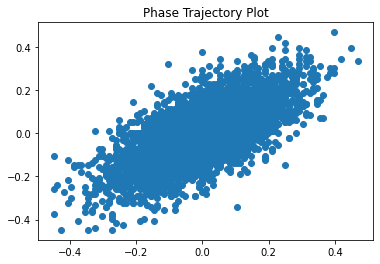

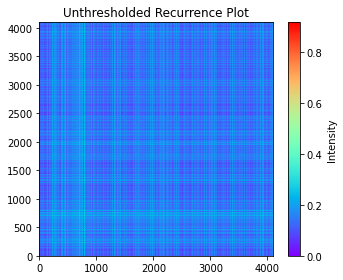

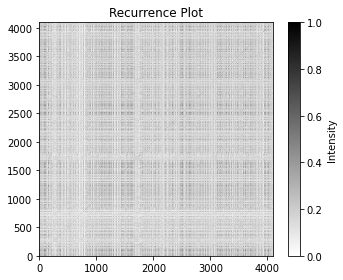

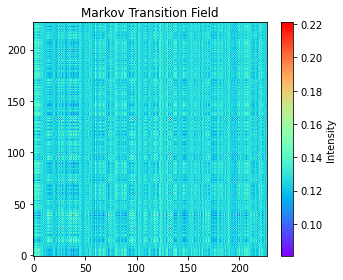

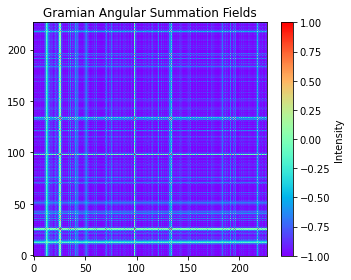

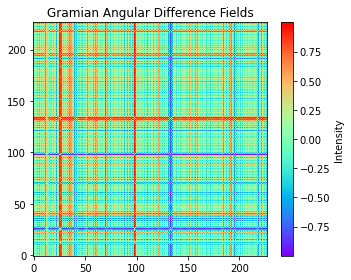

signal shape:  (227,)
waveform:  (227,)
spectrum:  (113,)
spectrogram_db:  (1025, 1)
mfccs:  (20, 1)


/home/svu/e1097232/.local/lib/python3.8/site-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=227
  warnings.warn(


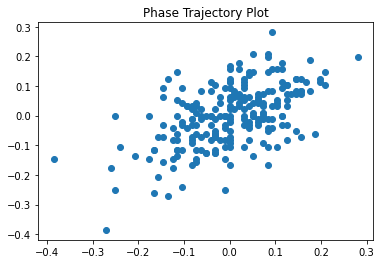

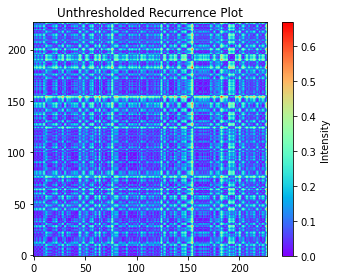

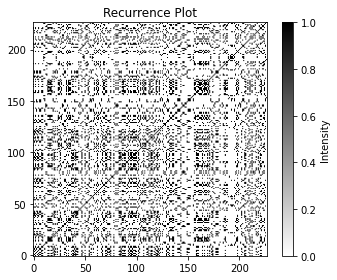

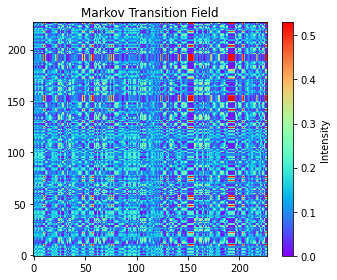

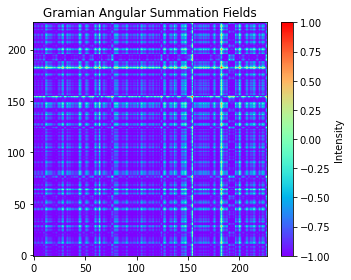

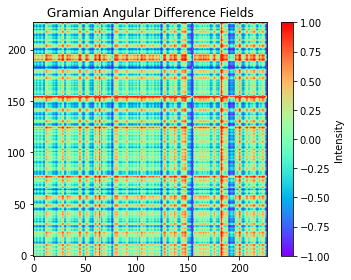

array([[ 0.        , -0.15625   ,  0.        , ...,  0.16023708,
        -0.3982178 , -0.84413782],
       [ 0.15625   ,  0.        ,  0.15625   , ...,  0.3125    ,
        -0.25      , -0.75      ],
       [ 0.        , -0.15625   ,  0.        , ...,  0.16023708,
        -0.3982178 , -0.84413782],
       ...,
       [-0.16023708, -0.3125    , -0.16023708, ...,  0.        ,
        -0.54005626, -0.91913764],
       [ 0.3982178 ,  0.25      ,  0.3982178 , ...,  0.54005626,
         0.        , -0.56082492],
       [ 0.84413782,  0.75      ,  0.84413782, ...,  0.91913764,
         0.56082492,  0.        ]])

In [6]:
# 1D original
def wave2wave(X, show):
    if show==1:
        print("waveform: ", X.shape)
    return X

# 1D spectrum
def wave2spectrum(X, show):
    spectrum = np.abs(np.fft.fft(X))
    spectrum = spectrum[0:len(spectrum)//2]
    if show==1:
        print("spectrum: ", spectrum.shape)
    return spectrum

# 2D spectrogram
def wave2spectrogram(X, show):
    spectrogram = np.abs(librosa.stft(X))
    spectrogram_db = librosa.amplitude_to_db(spectrogram, ref=np.max)
    if show==1:
        print("spectrogram_db: ", spectrogram_db.shape)
    return spectrogram_db

# 2D mfcc
def wave2mfcc(X, show):
    mfccs = librosa.feature.mfcc(y=X, sr=RATE)
    if show==1:
         print("mfccs: ", mfccs.shape)
    return mfccs

# 2D ptp
def wave2ptp(X, show):
    autocorr = np.correlate(X, X, mode='full')
    time_delay = np.argmax(autocorr[len(autocorr)//2:]) + 1
    embedding = np.array([X[:-2*time_delay], X[time_delay:-time_delay]]).T
    if show==1:
        plt.scatter(embedding[:, 0], embedding[:, 1])
        plt.title('Phase Trajectory Plot')
        plt.show()
    return embedding

# 2D urp
def wave2urp(X, show):
    urp = RecurrencePlot(threshold=None)
    X_urp = urp.fit_transform(X.reshape(1, -1))[0]
    if show==1:
        plt.imshow(X_urp, cmap='rainbow', origin='lower')
        plt.title('Unthresholded Recurrence Plot')
        plt.colorbar(label='Intensity', fraction=0.0457, pad=0.04)
        plt.tight_layout()
        plt.show()
    return X_urp

# 2D rp
def wave2rp(X, show):
    rp = RecurrencePlot(threshold='point', percentage=20)
    X_rp = rp.fit_transform(X.reshape(1, -1))[0]
    if show==1:
        plt.imshow(X_rp, cmap='binary', origin='lower')
        plt.title('Recurrence Plot')
        plt.colorbar(label='Intensity', fraction=0.0457, pad=0.04)
        plt.tight_layout()
        plt.show()
    return X_rp

#2D mtf
def wave2mtf(X, show):
    mtf = MarkovTransitionField(image_size=227)
    X_mtf = mtf.fit_transform(X.reshape(1, -1))[0]
    if show==1:
        plt.imshow(X_mtf, cmap='rainbow', origin='lower')
        plt.title('Markov Transition Field')
        plt.colorbar(label='Intensity', fraction=0.0457, pad=0.04)
        plt.tight_layout()
        plt.show()
    return X_mtf

# 2D ga(s)f
def wave2gasf(X, show):
    gasf = GramianAngularField(image_size=227, method='summation')
    X_gasf = gasf.fit_transform(X.reshape(1, -1))[0]
    if show==1:
        plt.imshow(X_gasf, cmap='rainbow', origin='lower')
        plt.title('Gramian Angular Summation Fields')
        plt.colorbar(label='Intensity', fraction=0.0457, pad=0.04)
        plt.tight_layout()
        plt.show()
    return X_gasf

# 2D ga(d)f
def wave2gadf(X, show):
    gadf = GramianAngularField(image_size=227, method='difference')
    X_gadf = gadf.fit_transform(X.reshape(1, -1))[0]
    if show==1:
        plt.imshow(X_gadf, cmap='rainbow', origin='lower')
        plt.title('Gramian Angular Difference Fields')
        plt.colorbar(label='Intensity', fraction=0.0457, pad=0.04)
        plt.tight_layout()
        plt.show()
    return X_gadf

SIGNAL = G32h[0]
print("signal shape: ", SIGNAL.shape)
wave2wave(SIGNAL, 1)
wave2spectrum(SIGNAL, 1)
wave2spectrogram(SIGNAL, 1)
wave2mfcc(SIGNAL, 1)
wave2ptp(SIGNAL, 1)
wave2urp(SIGNAL, 1)
wave2rp(SIGNAL, 1)
wave2mtf(SIGNAL, 1)
wave2gasf(SIGNAL, 1)
wave2gadf(SIGNAL, 1)
SIGNAL = SIGNAL[0:227]
print("signal shape: ", SIGNAL.shape)
wave2wave(SIGNAL, 1)
wave2spectrum(SIGNAL, 1)
wave2spectrogram(SIGNAL, 1)
wave2mfcc(SIGNAL, 1)
wave2ptp(SIGNAL, 1)
wave2urp(SIGNAL, 1)
wave2rp(SIGNAL, 1)
wave2mtf(SIGNAL, 1)
wave2gasf(SIGNAL, 1)
wave2gadf(SIGNAL, 1)

In [7]:
def wave2others(signals):
    function = wave2spectrum
    results = []
    if function == wave2rp or function == wave2urp:
        random.seed(42)
        shorter_length = 227
        for signal in tqdm(signals):
            shorter_arrays = [signal[i:i+shorter_length] for i in range(len(signal) - shorter_length + 1)]
            signal = random.choice(shorter_arrays)
            result = wave2spectrum(signal, 0)
            result = function(signal, 0)
            results.append(result)
    else:
        for signal in tqdm(signals):
            result = wave2spectrum(signal, 0)
            result = function(signal, 0)
            results.append(result)
    results = np.array(results)
    return results

G32h = wave2others(G32h)
G41h = wave2others(G41h)
G42h = wave2others(G42h)
G43b = wave2others(G43b)

S11 = wave2others(S11)
S12 = wave2others(S12)
S13 = wave2others(S13)
S14 = wave2others(S14)
S21 = wave2others(S21)
S22 = wave2others(S22)
S23 = wave2others(S23)
S31 = wave2others(S31)
S32 = wave2others(S32)
S33 = wave2others(S33)
S41 = wave2others(S41)
S42 = wave2others(S42)
S43 = wave2others(S43)
S51 = wave2others(S51)
S52 = wave2others(S52)
S53 = wave2others(S53)
S54 = wave2others(S54)
S61 = wave2others(S61)
S62 = wave2others(S62)
S63 = wave2others(S63)
S71 = wave2others(S71)
S72 = wave2others(S72)
S73 = wave2others(S73)
S74 = wave2others(S74)
S81 = wave2others(S81)
S82 = wave2others(S82)
S83 = wave2others(S83)
S91 = wave2others(S91)
S92 = wave2others(S92)
S93 = wave2others(S93)
S94 = wave2others(S94)

B11 = wave2others(B11)
B12 = wave2others(B12)
B13 = wave2others(B13)
B21 = wave2others(B21)
B22 = wave2others(B22)
B23 = wave2others(B23)
B31 = wave2others(B31)
B32 = wave2others(B32)
B33 = wave2others(B33)
B41 = wave2others(B41)
B42 = wave2others(B42)
B43 = wave2others(B43)
B51 = wave2others(B51)
B52 = wave2others(B52)
B53 = wave2others(B53)
B54 = wave2others(B54)
B61 = wave2others(B61)
B62 = wave2others(B62)
B63 = wave2others(B63)
B71 = wave2others(B71)
B72 = wave2others(B72)
B73 = wave2others(B73)
B81 = wave2others(B81)
B82 = wave2others(B82)
B83 = wave2others(B83)
B91 = wave2others(B91)
B92 = wave2others(B92)
B93 = wave2others(B93)

check_all()

100%|██████████████████████████████████████████████████████████████████████| 630/630 [00:00<00:00, 9059.78it/s]

G32h (4222, 2048)
G41h (2878, 2048)
G42h (5038, 2048)
G43b (8558, 2048)
S11 (598, 2048)
S12 (822, 2048)
S13 (934, 2048)
S14 (534, 2048)
S21 (410, 2048)
S22 (622, 2048)
S23 (334, 2048)
S31 (342, 2048)
S32 (546, 2048)
S33 (386, 2048)
S41 (162, 2048)
S42 (90, 2048)
S43 (78, 2048)
S51 (98, 2048)
S52 (90, 2048)
S53 (106, 2048)
S54 (94, 2048)
S61 (66, 2048)
S62 (86, 2048)
S63 (62, 2048)
S71 (286, 2048)
S72 (966, 2048)
S73 (574, 2048)
S74 (694, 2048)
S81 (310, 2048)
S82 (418, 2048)
S83 (726, 2048)
S91 (178, 2048)
S92 (230, 2048)
S93 (622, 2048)
S94 (758, 2048)
B11 (1918, 2048)
B12 (1510, 2048)
B13 (1118, 2048)
B21 (610, 2048)
B22 (662, 2048)
B23 (630, 2048)
B31 (522, 2048)
B32 (982, 2048)
B33 (658, 2048)
B41 (394, 2048)
B42 (230, 2048)
B43 (326, 2048)
B51 (278, 2048)
B52 (1054, 2048)
B53 (354, 2048)
B54 (474, 2048)
B61 (802, 2048)
B62 (522, 2048)
B63 (470, 2048)
B71 (1166, 2048)
B72 (798, 2048)
B73 (1170, 2048)
B81 (702, 2048)
B82 (706, 2048)
B83 (834, 2048)
B91 (786, 2048)
B92 (526, 2048)
B9

## Classification

### Build dataset

In [8]:
# Rock type(3-classes: 0_granite, 1_sandstone, 2_bas
X_0 = np.concatenate((G32h, G41h, G42h, G43b), axis=0)
X_1 = np.concatenate((S11, S12, S13, S14, S21, S22, S23, S31, S32, S33,
                      S41, S42, S43, S51, S52, S53, S54, S61, S62, S63,
                      S71, S72, S73, S74, S81, S82, S83, S91, S92, S93, S94), axis=0)
X_2 = np.concatenate((B11, B12, B13, B21, B22, B23, B31, B32, B33,
                      B41, B42, B43, B51, B52, B53, B54, B61, B62, B63,
                      B71, B72, B73, B81, B82, B83, B91, B92, B93), axis=0)
min_size = min(len(X_0), len(X_1), len(X_2))
X_0 = X_0[np.random.choice(len(X_0), size=min_size, replace=False)]
X_1 = X_1[np.random.choice(len(X_1), size=min_size, replace=False)]
X_2 = X_2[np.random.choice(len(X_2), size=min_size, replace=False)]
Y_0 = np.repeat(0, len(X_0))
Y_1 = np.repeat(1, len(X_1))
Y_2 = np.repeat(2, len(X_2))
X_set = np.concatenate((X_0, X_1, X_2), axis=0)
Y_set = np.concatenate((Y_0, Y_1, Y_2), axis=0)
num_classes = len(np.unique(Y_set))

# # Bit type(3-classes: 0_IDB, 1_PDC, 2_MMC)
# X_0 = np.concatenate((G32h, G41h, G42h, G43b,
#                       S11, S12, S13, S14, S21, S22, S23, S31, S32, S33,
#                       B11, B12, B13, B21, B22, B23, B31, B32, B33), axis=0)
# X_1 = np.concatenate((S41, S42, S43, S51, S52, S53, S54, S61, S62, S63,
#                       B41, B42, B43, B51, B52, B53, B54, B61, B62, B63), axis=0)
# X_2 = np.concatenate((S71, S72, S73, S74, S81, S82, S83, S91, S92, S93, S94,
#                       B71, B72, B73, B81, B82, B83, B91, B92, B93), axis=0)
# min_size = min(len(X_0), len(X_1), len(X_2))
# X_0 = X_0[np.random.choice(len(X_0), size=min_size, replace=False)]
# X_1 = X_1[np.random.choice(len(X_1), size=min_size, replace=False)]
# X_2 = X_2[np.random.choice(len(X_2), size=min_size, replace=False)]
# Y_0 = np.repeat(0, len(X_0))
# Y_1 = np.repeat(1, len(X_1))
# Y_2 = np.repeat(2, len(X_2))
# X_set = np.concatenate((X_0, X_1, X_2), axis=0)
# Y_set = np.concatenate((Y_0, Y_1, Y_2), axis=0)
# num_classes = len(np.unique(Y_set)) 

print(type(X_0), X_0.shape, type(Y_0), type(Y_0[0]), Y_0.shape)
print(type(X_1), X_1.shape, type(Y_1), type(Y_1[0]), Y_1.shape)
print(type(X_2), X_2.shape, type(Y_2), type(Y_2[0]), Y_2.shape)
print(type(X_set), X_set.shape, type(Y_set), type(Y_set[0]), Y_set.shape)

<class 'numpy.ndarray'> (12222, 2048) <class 'numpy.ndarray'> <class 'numpy.int64'> (12222,)
<class 'numpy.ndarray'> (12222, 2048) <class 'numpy.ndarray'> <class 'numpy.int64'> (12222,)
<class 'numpy.ndarray'> (12222, 2048) <class 'numpy.ndarray'> <class 'numpy.int64'> (12222,)
<class 'numpy.ndarray'> (36666, 2048) <class 'numpy.ndarray'> <class 'numpy.int64'> (36666,)


### ML model

#### Normal model

In [9]:
# x_train, x_test, y_train, y_test = train_test_split(X_set, Y_set, test_size=0.2, random_state=42)

# print("x_train:", x_train.shape)
# print("y_train:", y_train.shape)  
# print("x_test:", x_test.shape)
# print("y_test:", y_test.shape)

In [10]:
# import xgboost as xgb
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# from sklearn.metrics import classification_report, confusion_matrix
# from sklearn.naive_bayes import GaussianNB
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.svm import SVC
# from sklearn.tree import DecisionTreeClassifier

# # K-Nearest Neighbors (KNN)
# def make_knn():
#     model = KNeighborsClassifier(n_neighbors=num_classes) 
#     model.fit(x_train, y_train)
#     return model

# # Decision Tree Classifier
# def make_dtc():
#     model = DecisionTreeClassifier()
#     model.fit(x_train, y_train)
#     return model

# # Random Forest Classifier
# def make_rfc():
#     model = RandomForestClassifier(n_estimators=100, random_state=42)
#     model.fit(x_train, y_train)
#     return model

# # Naive Bayes Classifier
# def make_nbc():
#     model = GaussianNB()
#     model.fit(x_train, y_train)
#     return model

# time0 = time.time()
# model = make_rfc()
# time1 = time.time()
# y_pred = model.predict(x_test)
# accuracy = accuracy_score(y_test, y_pred)
# precision = precision_score(y_test, y_pred, average='weighted')
# recall = recall_score(y_test, y_pred, average='weighted')
# f1 = f1_score(y_test, y_pred, average='weighted')
# classification_report = classification_report(y_test, y_pred)
# confusion_matrix = confusion_matrix(y_test, y_pred)
# time2 = time.time()

# print("Train time:", time1-time0)
# print("Predict time:", time2-time1)
# print("Accuracy:", accuracy)
# print("Precision:", precision)
# print("Recall:", recall)
# print("F1 Score:", f1)
# print("\nClassification Report:\n", classification_report)
# print("\nConfusion Matrix:\n", confusion_matrix)

#### Model explanation

In [11]:
dataset = np.concatenate((Y_set.reshape((Y_set.shape[0], 1)), X_set), axis=1)

df = pd.DataFrame(dataset)
new_columns = {}
for column in df.columns:
    new_columns[column] = str(column) + "Hz"
df = df.rename(columns=new_columns)
df.rename(columns={df.columns[0]: 'type'}, inplace=True)
df['type'] = df['type'].astype('int64')
print(df)
# df.to_csv(os.path.join(HOST_path, "IDB_drilling_signal/dataset.csv"))

       type       1Hz       2Hz       3Hz       4Hz       5Hz       6Hz  \
0         0  0.490741  0.718279  0.279308  0.439676  0.809224  0.495787   
1         0  0.128205  0.328715  0.720205  0.371915  0.532824  0.412451   
2         0  0.037037  0.373459  0.179469  0.314593  0.431499  0.649873   
3         0  0.212963  0.500166  0.307681  0.552616  0.055429  0.749833   
4         0  0.675926  0.361703  0.696378  0.518557  0.523723  0.270745   
...     ...       ...       ...       ...       ...       ...       ...   
36661     2  0.637880  0.634495  0.606684  0.590309  0.598958  0.615570   
36662     2  0.163163  0.169348  0.176308  0.179938  0.174652  0.174047   
36663     2  0.416255  0.410226  0.413086  0.416311  0.412469  0.416456   
36664     2  0.873433  0.814268  0.850136  0.860354  0.887949  0.910235   
36665     2  1.767512  1.775173  1.804760  1.798626  1.795423  1.825901   

            7Hz       8Hz       9Hz  ...    2039Hz    2040Hz    2041Hz  \
0      0.570369  0.836815

In [12]:
df.shape

(36666, 2049)

In [13]:
df.columns

Index(['type', '1Hz', '2Hz', '3Hz', '4Hz', '5Hz', '6Hz', '7Hz', '8Hz', '9Hz',
       ...
       '2039Hz', '2040Hz', '2041Hz', '2042Hz', '2043Hz', '2044Hz', '2045Hz',
       '2046Hz', '2047Hz', '2048Hz'],
      dtype='object', length=2049)

In [14]:
df.describe()

,type,1Hz,2Hz,3Hz,4Hz,5Hz,6Hz,7Hz,8Hz,9Hz,...,2039Hz,2040Hz,2041Hz,2042Hz,2043Hz,2044Hz,2045Hz,2046Hz,2047Hz,2048Hz
count,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,...,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000,36666.000000
mean,1.000000,0.715078,0.740620,0.744683,0.746596,0.748292,0.750339,0.752121,0.758351,0.764577,...,0.386579,0.383382,0.384095,0.377878,0.374010,0.378895,0.377756,0.382596,0.382901,0.387274
std,0.816508,0.724390,0.694527,0.693679,0.695709,0.695521,0.701244,0.702429,0.701189,0.711552,...,0.339556,0.337911,0.334795,0.328922,0.324128,0.327821,0.327669,0.330340,0.332218,0.335336
min,0.000000,0.000000,0.001353,0.001867,0.001263,0.002224,0.005025,0.002909,0.002469,0.000380,...,0.000118,0.000280,0.000252,0.000199,0.000135,0.000072,0.000150,0.000173,0.000202,0.000133
25%,0.000000,0.240204,0.305841,0.310276,0.311744,0.308448,0.313349,0.312594,0.320346,0.322266,...,0.126716,0.126894,0.126941,0.125630,0.125425,0.126375,0.126346,0.126238,0.125410,0.127490
50%,1.000000,0.518519,0.554759,0.560857,0.558500,0.560847,0.557882,0.561817,0.568994,0.571517,...,0.299445,0.294257,0.296993,0.290291,0.290505,0.293771,0.294632,0.298700,0.297049,0.299583
75%,2.000000,0.947368,0.947216,0.954468,0.955696,0.959266,0.951459,0.960175,0.963133,0.971005,...,0.553504,0.546872,0.549704,0.540582,0.534516,0.544588,0.540432,0.552742,0.550631,0.558309
max,2.000000,11.252756,11.329580,11.552081,11.330140,10.833518,10.490925,10.466295,10.743971,11.030292,...,3.055560,3.056456,2.793007,2.977852,2.878507,2.913642,3.123806,3.073891,3.155838,3.048782


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36666 entries, 0 to 36665
Columns: 2049 entries, type to 2048Hz
dtypes: float64(2048), int64(1)
memory usage: 573.2 MB


In [16]:
df.isnull().sum()

type      0
1Hz       0
2Hz       0
3Hz       0
4Hz       0
         ..
2044Hz    0
2045Hz    0
2046Hz    0
2047Hz    0
2048Hz    0
Length: 2049, dtype: int64

In [17]:
df.corr()

,type,1Hz,2Hz,3Hz,4Hz,5Hz,6Hz,7Hz,8Hz,9Hz,...,2039Hz,2040Hz,2041Hz,2042Hz,2043Hz,2044Hz,2045Hz,2046Hz,2047Hz,2048Hz
type,1.000000,0.232912,0.233829,0.231454,0.233337,0.238515,0.242089,0.246522,0.248511,0.253665,...,-0.388759,-0.385939,-0.389928,-0.385124,-0.383564,-0.388639,-0.381829,-0.402478,-0.414941,-0.424918
1Hz,0.232912,1.000000,0.860415,0.860584,0.858969,0.860521,0.861885,0.861320,0.861571,0.859096,...,-0.069499,-0.072012,-0.069325,-0.072118,-0.072458,-0.070741,-0.069329,-0.070538,-0.070276,-0.078024
2Hz,0.233829,0.860415,1.000000,0.898868,0.897374,0.899407,0.899158,0.898607,0.897259,0.895754,...,-0.055431,-0.055117,-0.054040,-0.051825,-0.052129,-0.054602,-0.049377,-0.053505,-0.051938,-0.055201
3Hz,0.231454,0.860584,0.898868,1.000000,0.896157,0.899257,0.897188,0.895943,0.897483,0.896493,...,-0.052162,-0.056269,-0.051532,-0.051938,-0.048303,-0.052702,-0.046568,-0.051455,-0.051630,-0.054430
4Hz,0.233337,0.858969,0.897374,0.896157,1.000000,0.898486,0.896274,0.896289,0.897803,0.895072,...,-0.052426,-0.058294,-0.055679,-0.050640,-0.052615,-0.048455,-0.047294,-0.056347,-0.057447,-0.058480
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044Hz,-0.388639,-0.070741,-0.054602,-0.052702,-0.048455,-0.049770,-0.057181,-0.059581,-0.060236,-0.063764,...,0.511114,0.505565,0.518640,0.514238,0.506111,1.000000,0.522362,0.515527,0.505747,0.503777
2045Hz,-0.381829,-0.069329,-0.049377,-0.046568,-0.047294,-0.049378,-0.049697,-0.060323,-0.059907,-0.060529,...,0.504576,0.509520,0.510768,0.510483,0.514314,0.522362,1.000000,0.515868,0.514154,0.512449
2046Hz,-0.402478,-0.070538,-0.053505,-0.051455,-0.056347,-0.056145,-0.058410,-0.065197,-0.062362,-0.069273,...,0.510158,0.506080,0.513407,0.507812,0.511472,0.515527,0.515868,1.000000,0.514762,0.510438
2047Hz,-0.414941,-0.070276,-0.051938,-0.051630,-0.057447,-0.054341,-0.058748,-0.063812,-0.063128,-0.067233,...,0.501255,0.506355,0.509201,0.508617,0.499319,0.505747,0.514154,0.514762,1.000000,0.521348


In [18]:
X = df.drop('type',axis=1)
y = df['type']
print(X.shape, y.shape)
print(X)
print(y)

(36666, 2048) (36666,)
            1Hz       2Hz       3Hz       4Hz       5Hz       6Hz       7Hz  \
0      0.490741  0.718279  0.279308  0.439676  0.809224  0.495787  0.570369   
1      0.128205  0.328715  0.720205  0.371915  0.532824  0.412451  0.674223   
2      0.037037  0.373459  0.179469  0.314593  0.431499  0.649873  0.348901   
3      0.212963  0.500166  0.307681  0.552616  0.055429  0.749833  0.501989   
4      0.675926  0.361703  0.696378  0.518557  0.523723  0.270745  0.635400   
...         ...       ...       ...       ...       ...       ...       ...   
36661  0.637880  0.634495  0.606684  0.590309  0.598958  0.615570  0.642579   
36662  0.163163  0.169348  0.176308  0.179938  0.174652  0.174047  0.184798   
36663  0.416255  0.410226  0.413086  0.416311  0.412469  0.416456  0.416022   
36664  0.873433  0.814268  0.850136  0.860354  0.887949  0.910235  0.917249   
36665  1.767512  1.775173  1.804760  1.798626  1.795423  1.825901  1.808674   

            8Hz       9Hz   

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [20]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(max_depth=5, n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, random_state=42)

In [21]:
y_pred = model.predict(X_test)

In [22]:
y_pred

array([0, 1, 0, ..., 0, 1, 0])

In [23]:
y_pred_proba = model.predict_proba(X_test)

In [24]:
y_pred_proba

array([[0.89254517, 0.09670975, 0.01074508],
       [0.12232603, 0.79494902, 0.08272495],
       [0.91064992, 0.08315154, 0.00619854],
       ...,
       [0.8242    , 0.16692013, 0.00887986],
       [0.09188218, 0.85776157, 0.05035625],
       [0.81484349, 0.1762754 , 0.00888111]])

In [26]:
import shap
shap.initjs()

In [27]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

In [28]:
len(shap_values)

3

In [29]:
shap_values[0].shape

(7334, 2048)

In [30]:
shap_values[1].shape

(7334, 2048)

In [31]:
shap_values[2].shape

(7334, 2048)

In [32]:
print(shap_values)

[array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         3.63585556e-04,  6.04319678e-04,  6.08009574e-04],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        -3.49280692e-03,  4.00781344e-04,  1.00955908e-03],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         2.08578019e-03,  9.89147633e-04,  7.39163278e-04],
       ...,
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         1.40951457e-03,  2.71680090e-05,  4.79769347e-04],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         3.85193984e-04,  2.82127928e-04, -1.25001887e-04],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        -8.22438659e-04,  1.27874229e-03,  2.55168115e-04]]), array([[ 0.        ,  0.        ,  0.        , ...,  0.0028588 ,
         0.00333047,  0.00071171],
       [ 0.        ,  0.        ,  0.        , ..., -0.00018736,
         0.00332956,  0.00186141],
       [ 0.        ,  0.        ,  0.    

In [33]:
explainer.expected_value

array([0.33337413, 0.33322821, 0.33339765])

In [35]:
explainer.expected_value[0] + explainer.expected_value[1]+ explainer.expected_value[2]

1.0

In [36]:
model.predict_proba(X_test)

array([[0.89254517, 0.09670975, 0.01074508],
       [0.12232603, 0.79494902, 0.08272495],
       [0.91064992, 0.08315154, 0.00619854],
       ...,
       [0.8242    , 0.16692013, 0.00887986],
       [0.09188218, 0.85776157, 0.05035625],
       [0.81484349, 0.1762754 , 0.00888111]])

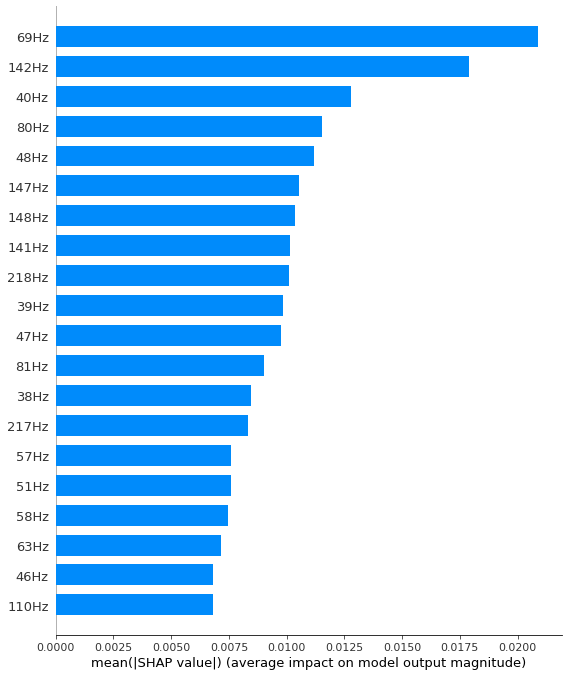

In [37]:
shap.summary_plot(shap_values[0], X_test, plot_type="bar")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


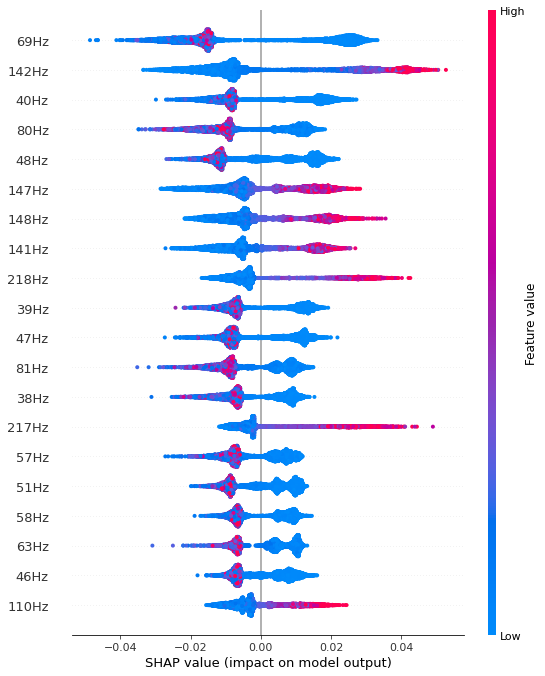

In [40]:
shap.summary_plot(shap_values[0], X_test)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


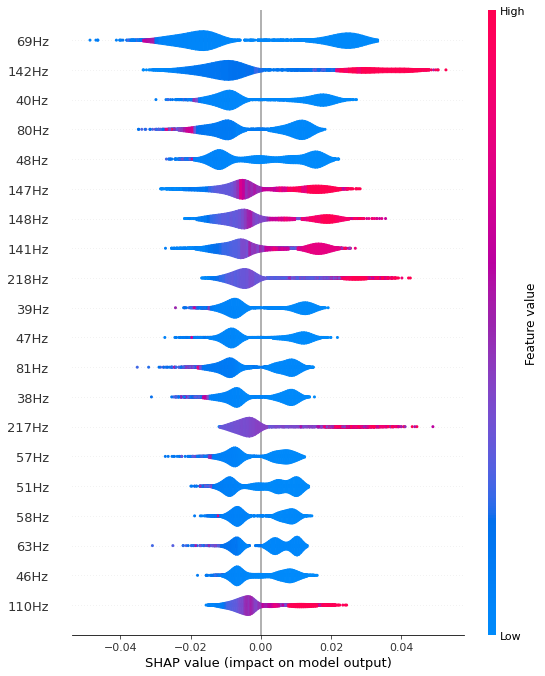

In [43]:
shap.summary_plot(shap_values[0], X_test, plot_type="violin")

In [60]:
shap_interaction_values = explainer.shap_interaction_values(X_test)
shap.summary_plot(shap_interaction_values[0],X_test)

MemoryError: Unable to allocate 688. GiB for an array with shape (7334, 2049, 2049, 3) and data type float64

In [49]:
X_test.head(10)

,1Hz,2Hz,3Hz,4Hz,5Hz,6Hz,7Hz,8Hz,9Hz,10Hz,...,2039Hz,2040Hz,2041Hz,2042Hz,2043Hz,2044Hz,2045Hz,2046Hz,2047Hz,2048Hz
1701,1.602564,1.181547,1.039322,0.872625,1.225684,1.341556,1.229173,1.154809,0.835790,1.366607,...,0.818643,0.525158,0.260765,0.271981,0.176897,0.475023,0.433274,0.909686,0.660490,0.401016
22931,0.142857,0.417740,0.360448,0.545967,0.621979,0.562270,0.842894,0.285997,0.171129,0.283197,...,0.594121,0.253020,0.138542,0.261770,0.484387,0.411105,0.123391,0.050701,0.509065,0.418252
2762,0.990741,0.403636,0.822242,0.691923,0.678292,0.510855,0.836647,0.874605,0.710442,0.969231,...,0.213489,0.186342,0.383217,0.246330,0.309199,0.108412,0.713824,0.258138,0.334831,0.384272
323,0.208333,0.274978,0.325466,0.263342,0.080314,0.755672,0.254156,0.047858,0.281782,0.451081,...,0.130244,0.369400,0.248743,0.304611,0.765196,0.462125,0.643312,0.377690,0.402218,0.122641
21414,0.482759,0.276145,1.348537,0.690092,0.791592,0.062937,0.454463,0.623894,0.301754,0.464058,...,0.616023,0.665222,0.581369,1.017975,0.711806,1.225823,0.111895,0.119030,0.571242,0.199961
36330,0.223528,0.228261,0.223923,0.227716,0.240550,0.227489,0.228744,0.230403,0.236914,0.242248,...,0.158889,0.158878,0.158809,0.159139,0.159217,0.159013,0.159084,0.159162,0.159173,0.159215
27150,0.620254,0.615072,0.620138,0.617375,0.636349,0.639581,0.648504,0.651680,0.663697,0.677136,...,0.381007,0.380904,0.380802,0.380790,0.380708,0.380622,0.380596,0.380569,0.380525,0.380507
27652,0.136599,0.129502,0.129844,0.139950,0.141250,0.153246,0.163592,0.178107,0.179182,0.182989,...,0.151574,0.151495,0.151576,0.151385,0.151181,0.151081,0.150977,0.150879,0.150847,0.150812
2062,0.472222,0.587950,0.518886,1.066722,0.535872,0.909296,0.864259,0.615181,0.991838,0.383624,...,0.796575,0.928624,0.301077,1.309394,0.793854,0.918290,0.631294,0.688030,0.878650,0.540689
19070,0.283019,0.540553,0.383337,0.104999,0.162259,0.252676,0.269480,0.188438,0.175135,0.130725,...,0.142366,0.205923,0.311860,0.290678,0.274383,0.133925,0.143027,0.301092,0.181626,0.356992


In [50]:
example = X.iloc[323,:]
example

1Hz       0.208333
2Hz       0.274978
3Hz       0.325466
4Hz       0.263342
5Hz       0.080314
            ...   
2044Hz    0.462125
2045Hz    0.643312
2046Hz    0.377690
2047Hz    0.402218
2048Hz    0.122641
Name: 323, Length: 2048, dtype: float64

In [59]:
shap.summary_plot(shap_interaction_values[0][3], X_test, plot_type="bar")

NameError: name 'shap_interaction_values' is not defined

In [55]:
shap_values_example = explainer.shap_values(example)
shap_values_example

[array([ 0.        ,  0.        ,  0.        , ...,  0.00097536,
         0.00100756, -0.00054302]),
 array([ 0.        ,  0.        ,  0.        , ...,  0.00058745,
         0.00120091, -0.00045512]),
 array([ 0.        ,  0.        ,  0.        , ..., -0.00156281,
        -0.00220846,  0.00099814])]

In [56]:
shap_values_example[0] + shap_values_example[1] + shap_values_example[2]

array([ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
        1.51788304e-18, -8.67361738e-19,  8.67361738e-19])

In [57]:
shap.force_plot(explainer.expected_value[0], shap_values_example[0], example)

In [66]:
idx = 323

example = X.iloc[idx,:]
example_df = X.loc[idx:idx]
model_predict_proba = model.predict_proba(example_df)[0][0]
print('{}号的真实标签是 {} ，模型预测为 {:.2f} '.format(idx, y_test[idx], model_predict_proba))

shap_values_example = explainer.shap_values(example)
shap.force_plot(explainer.expected_value[0], shap_values_example[0], example)

323号的真实标签是 0 ，模型预测为 0.87 


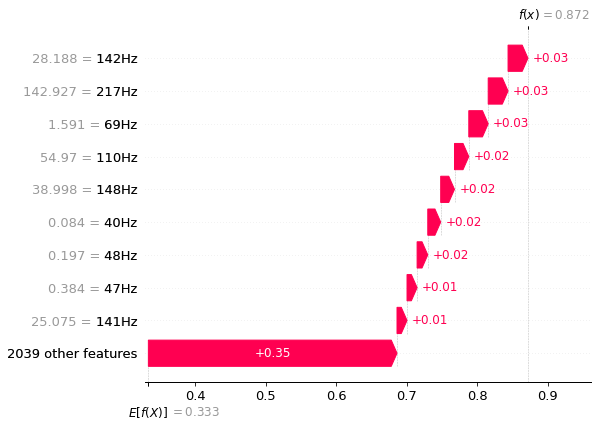

In [70]:
shap.waterfall_plot(shap.Explanation(values=shap_values_example[0], base_values=explainer.expected_value[0], data=example))

In [79]:
idx = 22931

example = X.iloc[idx,:]
example_df = X.loc[idx:idx]
model_predict_proba = model.predict_proba(example_df)[0][0]
print('{}号的真实标签是 {} ，模型预测为 {:.2f} '.format(idx, y_test[idx], model_predict_proba))

shap_values_example = explainer.shap_values(example)
shap.force_plot(explainer.expected_value[0], shap_values_example[0], example)

22931号的真实标签是 1 ，模型预测为 0.12 


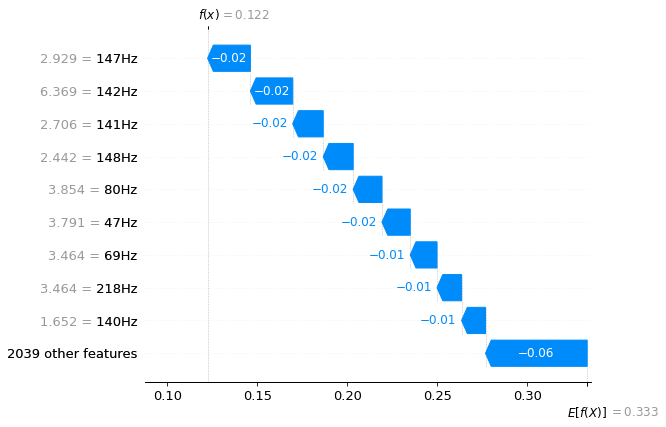

In [80]:
shap.waterfall_plot(shap.Explanation(values=shap_values_example[0], base_values=explainer.expected_value[0], data=example))

In [81]:
number_show = 60
shap_values_summary = explainer.shap_values(X_train.iloc[:number_show])
shap.force_plot(explainer.expected_value[0], shap_values_summary[0], X_test.iloc[:number_show])

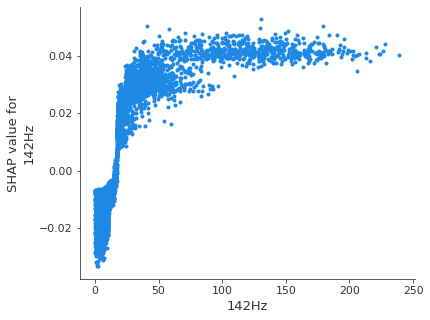

In [86]:
shap.dependence_plot("142Hz", shap_values[0], X_test, interaction_index=None)

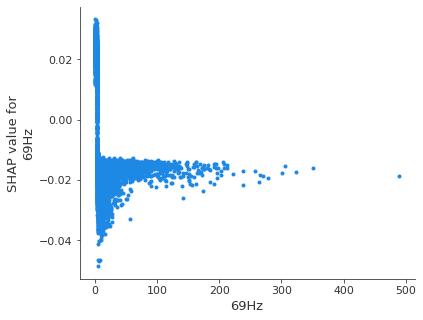

In [94]:
shap.dependence_plot("69Hz", shap_values[0], X_test, interaction_index=None)

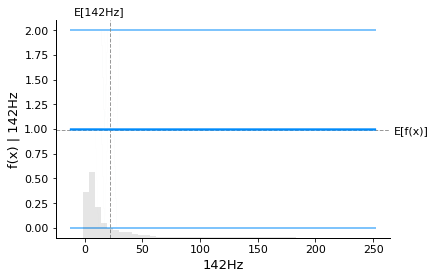

In [95]:
shap.partial_dependence_plot("142Hz", model.predict, X_test, model_expected_value=True, feature_expected_value=True)

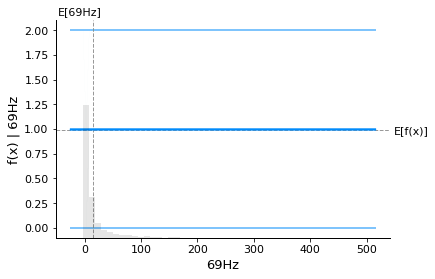

In [96]:
shap.partial_dependence_plot("69Hz", model.predict, X_test, model_expected_value=True, feature_expected_value=True)

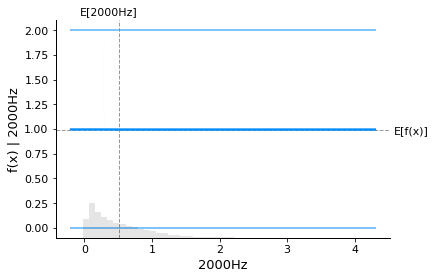

In [98]:
shap.partial_dependence_plot("2000Hz", model.predict, X_test, model_expected_value=True, feature_expected_value=True)

In [103]:
shap_values = explainer.shap_values(X_test)
expected_value = explainer.expected_value

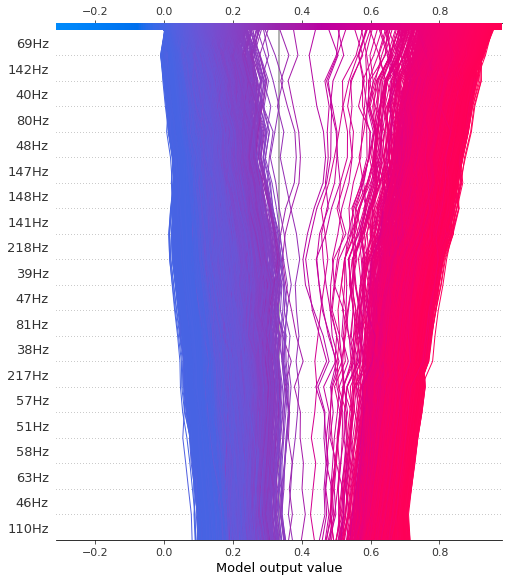

In [105]:
shap.decision_plot(expected_value[0], shap_values[0], X_test, ignore_warnings=True)

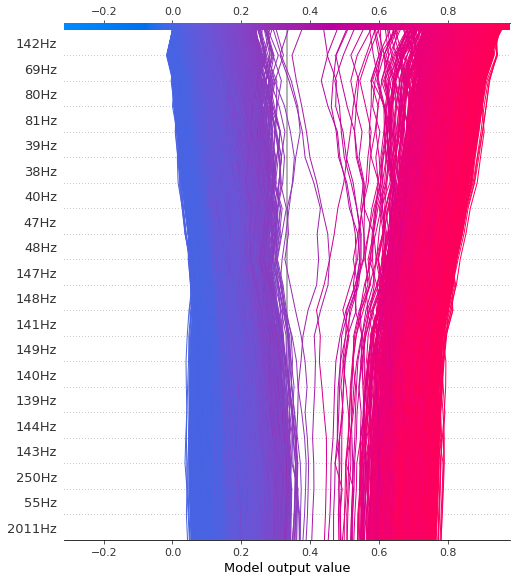

In [106]:
shap.decision_plot(expected_value[0], shap_values[0], X_test, ignore_warnings=True, feature_order='hclust')

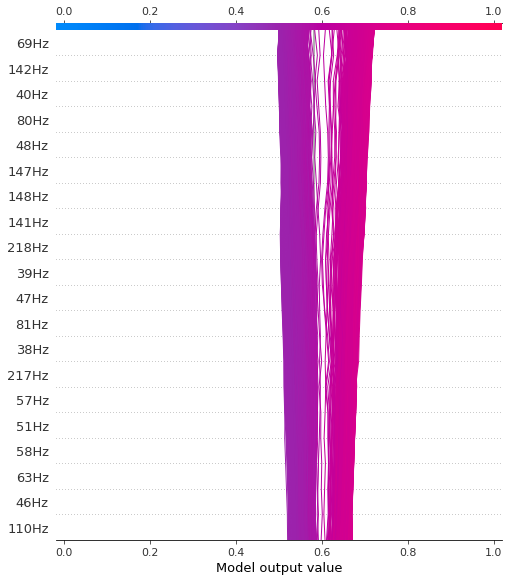

In [107]:
shap.decision_plot(expected_value[0], shap_values[0], X_test, ignore_warnings=True, link='logit')

索引号为 323 的样本，在原始数据集X中的索引号为 36498 


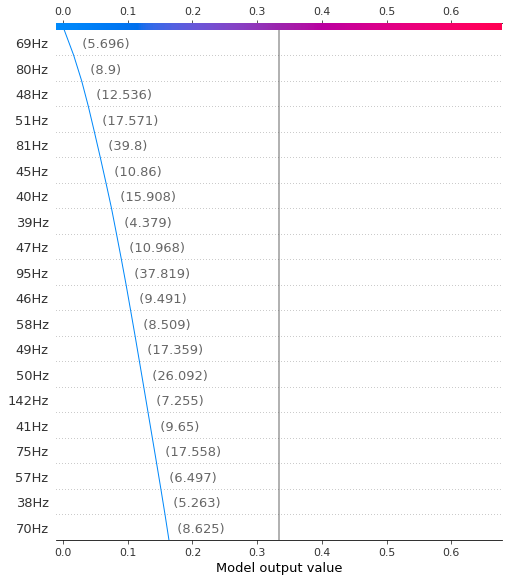

In [110]:
idx = 323
selection = np.zeros((len(X_test)))
selection[idx] = 1
selection = selection > 0

print('索引号为 {} 的样本，在原始数据集X中的索引号为 {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))

shap.decision_plot(expected_value[0], shap_values[0][selection], X_test[selection])

In [111]:
X_test.shape

(7334, 2048)

In [113]:
feature_idx = [i for i in range(X_test.shape[1])]
print(feature_idx)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

索引号为 323 的样本，在原始数据集X中的索引号为 36498 


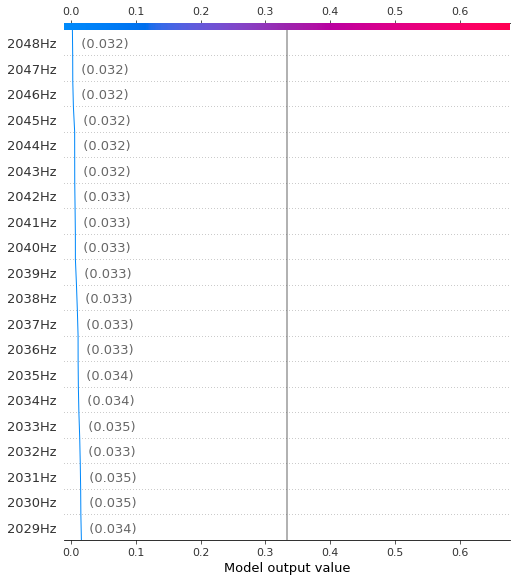

In [114]:
idx = 323
selection = np.zeros((len(X_test)))
selection[idx] = 1
selection = selection > 0

print('索引号为 {} 的样本，在原始数据集X中的索引号为 {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))
shap.decision_plot(expected_value[0], shap_values[0][selection], X_test[selection], feature_order=feature_idx)

In [117]:
idx = 323
X_test.loc[idx]

1Hz       0.208333
2Hz       0.274978
3Hz       0.325466
4Hz       0.263342
5Hz       0.080314
            ...   
2044Hz    0.462125
2045Hz    0.643312
2046Hz    0.377690
2047Hz    0.402218
2048Hz    0.122641
Name: 323, Length: 2048, dtype: float64

In [118]:
print('索引号为 {} 的样本，在原始数据集X中的索引号为 {} '.format(idx,X_test.iloc[idx:idx+1].index[0]))

索引号为 323 的样本，在原始数据集X中的索引号为 36498 


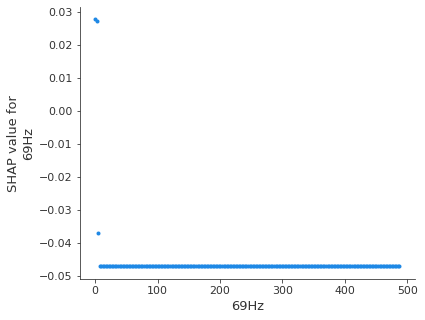

In [128]:
feature_selected = '69Hz'
sep = 200
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[0]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

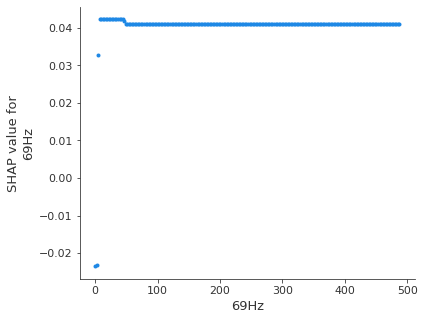

In [129]:
feature_selected = '69Hz'
sep = 200
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[1]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

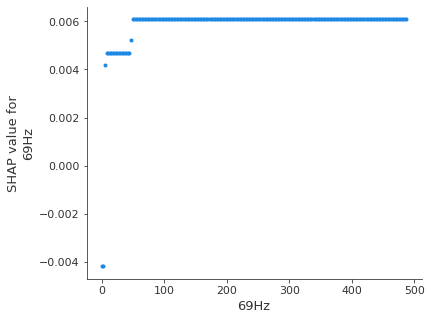

In [130]:
feature_selected = '69Hz'
sep = 200
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[2]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

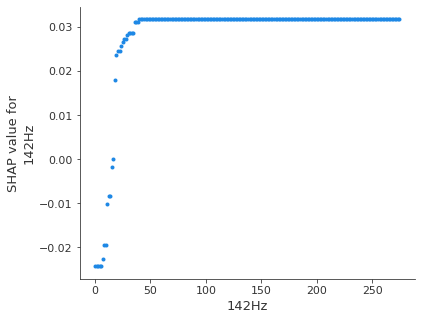

In [131]:
feature_selected = '142Hz'
sep = 200
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[0]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

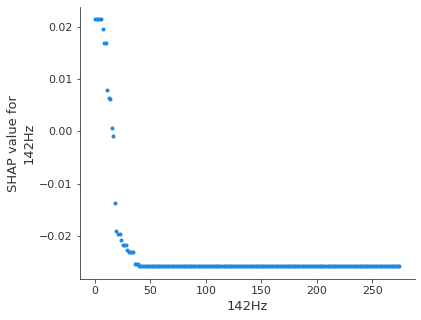

In [132]:
feature_selected = '142Hz'
sep = 200
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[1]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

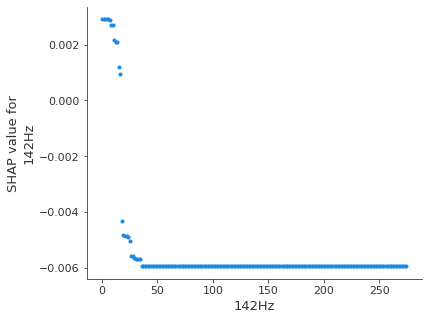

In [133]:
feature_selected = '142Hz'
sep = 200
feature_selected_min = X[feature_selected].min()
feature_selected_max = X[feature_selected].max()
step = (feature_selected_max - feature_selected_min)/sep
rg = np.arange(feature_selected_min, feature_selected_max, step)
R = X.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R[feature_selected] = rg
hypothetical_shap_values = explainer.shap_values(R)[2]
shap.dependence_plot(feature_selected, hypothetical_shap_values, R, interaction_index=None)

### DL model

In [ ]:
X_set = np.expand_dims(X_set, axis=-1)
Y_set = to_categorical(Y_set, num_classes=num_classes)

x_train, x_test, y_train, y_test = train_test_split(X_set, Y_set, test_size=0.2, random_state=42)

print("x_train:", x_train.shape)
print("y_train:", y_train.shape)  
print("x_test:", x_test.shape)
print("y_test:", y_test.shape)

In [ ]:
from keras.models import Model, Sequential
from keras.layers import Activation, BatchNormalization, Concatenate, Conv1D, Conv2D, Dense, Dropout, Flatten, GlobalAveragePooling1D, GlobalAveragePooling2D, Input, MaxPooling1D, MaxPooling2D

def make_1Dgap():
    model = Sequential()
    model.add(Conv1D(64, 3, activation='relu', padding='same', input_shape=x_train.shape[1:]))
    model.add(MaxPooling1D(2))
    model.add(GlobalAveragePooling1D())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

def make_1Ddense():
    model = Sequential()
    model.add(Conv1D(64, 7, strides=2, activation='relu', padding='same', input_shape=x_train.shape[1:]))
    model.add(MaxPooling1D(3, strides=2, padding='same'))
    model.add(Conv1D(32, 3, activation='relu', padding='same'))
    model.add(Concatenate())
    model.add(Conv1D(32, 3, activation='relu', padding='same'))
    model.add(Concatenate())
    model.add(Conv1D(32, 3, activation='relu', padding='same'))
    model.add(Concatenate())
    model.add(GlobalAveragePooling1D())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

def make_1Dalex():
    model = Sequential()
    model.add(Conv1D(96, 11, strides=4, activation='relu', input_shape=x_train.shape[1:]))  # (227, 1)
    model.add(MaxPooling1D(pool_size=3, strides=2))
    model.add(Conv1D(256, 5, activation='relu'))
    model.add(MaxPooling1D(pool_size=3, strides=2))
    model.add(Conv1D(384, 3, activation='relu'))
    model.add(Conv1D(384, 3, activation='relu'))
    model.add(Conv1D(256, 3, activation='relu'))
    model.add(MaxPooling1D(pool_size=3, strides=2))
    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))
    return model

def make_1Dvgg():
    model = Sequential()
    model.add(Conv1D(64, 3, activation='relu', padding='same', input_shape=x_train.shape[1:]))
    model.add(Conv1D(64, 3, activation='relu', padding='same'))
    model.add(MaxPooling1D(pool_size=2, strides=2))
    model.add(Conv1D(128, 3, activation='relu', padding='same'))
    model.add(Conv1D(128, 3, activation='relu', padding='same'))
    model.add(MaxPooling1D(pool_size=2, strides=2))
    model.add(Conv1D(256, 3, activation='relu', padding='same'))
    model.add(Conv1D(256, 3, activation='relu', padding='same'))
    model.add(Conv1D(256, 3, activation='relu', padding='same'))
    model.add(MaxPooling1D(pool_size=2, strides=2))
    model.add(Conv1D(512, 3, activation='relu', padding='same'))
    model.add(Conv1D(512, 3, activation='relu', padding='same'))
    model.add(Conv1D(512, 3, activation='relu', padding='same'))
    model.add(MaxPooling1D(pool_size=2, strides=2))
    model.add(Conv1D(512, 3, activation='relu', padding='same'))
    model.add(Conv1D(512, 3, activation='relu', padding='same'))
    model.add(Conv1D(512, 3, activation='relu', padding='same'))
    model.add(MaxPooling1D(pool_size=2, strides=2))
    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dense(4096, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))  
    return model


def make_2Dgap():
    model = Sequential()
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=x_train.shape[1:]))
    model.add(MaxPooling2D((2, 2)))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

def make_2Ddense():
    model = Sequential()
    model.add(Conv2D(64, (7, 7), strides=(2, 2), activation='relu', padding='same', input_shape=x_train.shape[1:]))
    model.add(MaxPooling2D((3, 3), strides=(2, 2), padding='same'))
    model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(Concatenate())
    model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(Concatenate())
    model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(Concatenate())
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

def make_2Dalex():
    model = Sequential()
    model.add(Conv2D(96, (11, 11), strides=(4, 4), activation='relu', input_shape=x_train.shape[1:]))  # (227, 227, 3)
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))
    model.add(Conv2D(256, (5, 5), activation='relu'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))
    model.add(Conv2D(384, (3, 3), activation='relu'))
    model.add(Conv2D(384, (3, 3), activation='relu'))
    model.add(Conv2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))
    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))  
    return model

def make_2Dvgg():
    model = Sequential()
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=x_train.shape[1:]))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dense(4096, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    return model

model = make_2Dgap()
model.summary()
# keras.utils.plot_model(model, show_shapes=True)

### Complete & Train

In [ ]:
time0 = time.time()
model.compile(optimizer='adam',                # tf.keras.optimizers.RMSprop(learning_rate=0.0001, decay=1e-6)
              loss='categorical_crossentropy', # loss='binary_crossentropy'
              metrics=['accuracy',
                       keras.metrics.AUC(),
                       keras.metrics.Precision(),
                       keras.metrics.Recall()])

callbacks = [
            #  keras.callbacks.ModelCheckpoint("best_model.hdf5",
            #                                  monitor="loss",
            #                                  mode="min",
            #                                  save_best_only=True),
             keras.callbacks.EarlyStopping(monitor="val_loss",
                                           mode="min",
                                           verbose=1,
                                           patience=10,
                                           restore_best_weights=True), 
             keras.callbacks.ReduceLROnPlateau(monitor="val_loss",
                                               factor=0.2,
                                               patience=2,
                                               min_lr=0.000001),
            # keras.callbacks.TensorBoard(log_dir=os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_logs"),
            #                             histogram_freq=1,
            #                             write_graph=True, 
            #                             write_images=True),
            ]

history = model.fit(x_train, y_train,
                    validation_split=0.2, 
                    epochs=200, 
                    batch_size=64, 
                    callbacks=callbacks, 
                    shuffle=True)
time1 = time.time()

### Show model results

In [ ]:
y_test_true = np.argmax(y_test, axis=1)
time2 = time.time()
y_test_pred = np.argmax(model.predict(x_test), axis=1)
cm = confusion_matrix(y_test_true, y_test_pred)
test_loss, test_accuracy, test_auc, test_precision, test_recall = model.evaluate(x_test, y_test)
time3 = time.time()
print("Train time:", time1-time0)
print("Predict time:", time3-time2)
print("test_loss: ", test_loss)
print("test_accuracy: ", test_accuracy)
print("test_auc: ", test_auc)
print("test_precision: ", test_precision)
print("test_recall: ", test_recall)
print("confusion matrix: \n", cm)

### Save model results

In [ ]:
eval_dict = {"y_test_true":y_test_true, "y_test_pred":y_test_pred, "test_loss":test_loss, "test_accuracy":test_accuracy, "test_auc":test_auc, "test_precision":test_precision, "test_recall":test_recall}
model.save(os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_model.hdf5"))
np.save(os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_history.npy"), history.history)
np.save(os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_evaluation.npy"), eval_dict)

### Load model results

In [ ]:
# model = load_model(os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_model.hdf5"))
# hist = np.load(os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_history.npy"), allow_pickle=True).item()
# eval_dict = np.load(os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_evaluation.npy"), allow_pickle=True).item()

### Plot model results

In [ ]:
def plot_history_metrics(history):
  total_plots = len(history)
  cols = total_plots // 2
  rows = total_plots // cols
  if total_plots % cols != 0:
    rows += 1
  pos = range(1, total_plots + 1)
  plt.figure(figsize=(15, 10))
  for i, (key, value) in enumerate(history.items()):
    plt.subplot(rows, cols, pos[i])
    plt.plot(range(len(value)), value)
    plt.title(str(key))
  plt.savefig(os.path.join(HOST_path, "IDB_drilling_signal/outputs/C_evaluation.png"))
 
plot_history_metrics(history.history)

## Regression

### Data pre-treatment

In [ ]:
# X_set = np.concatenate((S11,S12,S13,S14,S21,S22,S23,S31,S32,S33,S41,S42,S43,S51,S52,S53,S54,S61,S62,S63,S71,S72,S73,S74,S81,S82,S83,S91,S92,S93,S94), axis=0)
# X_set = X_set.reshape((X_set.shape[0], X_set.shape[1], 1))
# S1Y = [0,0,0, 150, 200, 8]
# S2Y = [0,0,0, 250, 250, 10]
# S3Y = [0,0,0, 350, 150, 6]
# S4Y = [0,1,0, 150, 250, 6]
# S5Y = [0,1,0, 250, 150, 8]
# S6Y = [0,1,0, 350, 200, 10]
# S7Y = [0,0,1, 150, 150, 10]
# S8Y = [0,0,1, 250, 200, 6]
# S9Y = [0,0,1, 350, 250, 8]
# S1L = len(S11)+len(S12)+len(S13)+len(S14)
# S2L = len(S21)+len(S22)+len(S23)
# S3L = len(S31)+len(S32)+len(S33)
# S4L = len(S41)+len(S42)+len(S43)
# S5L = len(S51)+len(S52)+len(S53)+len(S54)
# S6L = len(S61)+len(S62)+len(S63)
# S7L = len(S71)+len(S72)+len(S73)+len(S74)
# S8L = len(S81)+len(S82)+len(S83)
# S9L = len(S91)+len(S92)+len(S93)+len(S94)
# S_1 = [S1Y for _ in range(S1L)]
# S_2 = [S2Y for _ in range(S2L)]
# S_3 = [S3Y for _ in range(S3L)]
# S_4 = [S4Y for _ in range(S4L)]
# S_5 = [S5Y for _ in range(S5L)]
# S_6 = [S6Y for _ in range(S6L)]
# S_7 = [S7Y for _ in range(S7L)]
# S_8 = [S8Y for _ in range(S8L)]
# S_9 = [S9Y for _ in range(S9L)]
# Y_set = np.concatenate((S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9), axis=0)
# num_targets = Y_set.shape[1]
# x_train, x_test, y_train, y_test = train_test_split(X_set, Y_set, test_size=0.25, random_state=42)

### Model establishment

In [ ]:
# from keras.models import Sequential
# from keras.layers import Conv1D, MaxPooling1D, BatchNormalization
# from keras.layers import Activation, Dropout, Flatten, Dense

# def make_cnn_model():
#     model = Sequential()
#     model.add(Conv1D(64, 3, input_shape=x_train.shape[1:], padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(64, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(MaxPooling1D(pool_size=2, strides=2))
#     model.add(Conv1D(128, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(128, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(MaxPooling1D(pool_size=2, strides=2))
#     model.add(Conv1D(256, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(256, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(256, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(MaxPooling1D(pool_size=2, strides=2))
#     model.add(Conv1D(512, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(512, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(512, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(MaxPooling1D(pool_size=2, strides=2))
#     model.add(Conv1D(512, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(512, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Conv1D(512, 3, padding='same'))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(MaxPooling1D(pool_size=2, strides=2))
#     model.add(Flatten())
#     model.add(Dense(256))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Dropout(0.2))
#     model.add(Dense(4096))
#     model.add(BatchNormalization())
#     model.add(Activation('relu'))
#     model.add(Dropout(0.2))
#     model.add(Dense(num_targets, activation='linear'))
#     return model

# model = make_cnn_model()
# model.summary()
# # keras.utils.plot_model(model, show_shapes=True)

### Complete & Train

In [ ]:
# model.compile(optimizer='adam', loss='mse')

# callbacks = [
#             #  keras.callbacks.ModelCheckpoint("best_model.hdf5",
#             #                                  monitor="loss",
#             #                                  mode="min",
#             #                                  save_best_only=True),
#              keras.callbacks.EarlyStopping(monitor="val_loss",
#                                            mode="min",
#                                            verbose=1,
#                                            patience=10,
#                                            restore_best_weights=True), 
#              keras.callbacks.ReduceLROnPlateau(monitor="val_loss",
#                                                factor=0.2,
#                                                patience=2,
#                                                min_lr=0.000001),
#             # keras.callbacks.TensorBoard(log_dir=os.path.join(HOST_path, "IDB_drilling_signal/outputs/R_logs"),
#             #                             histogram_freq=1,
#             #                             write_graph=True, 
#             #                             write_images=True),
#             ]

# history = model.fit(x_train, y_train,
#                     validation_split=0.2, 
#                     epochs=200, 
#                     batch_size=32, 
#                     # callbacks=callbacks, 
#                     shuffle=True)

### Show model results

In [ ]:
# y_test_true = y_test
# y_test_pred = model.predict(x_test)
# test_loss = model.evaluate(x_test, y_test)

### Save model results

In [ ]:
# eval_dict = {"y_test_true":y_test_true, "y_test_pred":y_test_pred, "test_loss":test_loss}

# model.save(os.path.join(HOST_path, "IDB_drilling_signal/outputs/R_model.hdf5"))
# np.save(os.path.join(HOST_path, "IDB_drilling_signal/outputs/R_history.npy"), history.history)
# np.save(os.path.join(HOST_path, "IDB_drilling_signal/outputs/R_evaluation.npy"), eval_dict)

### Load model results

In [ ]:
# from keras.models import load_model

# model = load_model("/home/svu/e1097232/IDB_drilling_signal/outputs/R_model.hdf5")
# hist = np.load("/home/svu/e1097232/IDB_drilling_signal/outputs/R_history.npy", allow_pickle=True)
# eval_dict = np.load("/home/svu/e1097232/IDB_drilling_signal/outputs/R_evaluation.npy", allow_pickle=True)

### Plot model results

In [ ]:
# # Plot Loss-Epoch
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('Model Loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend(['Train set', 'Test set'], loc='upper left')
# plt.savefig(os.path.join(HOST_path, "IDB_drilling_signal/outputs/R_loss.png"))
# plt.show()